# Project 1: Computational Photography

## Part I : Hybrid

In [1]:
# load extensions
%load_ext autoreload
%autoreload 2

# load packages
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from scipy import signal

# enable interactive matplotlib
%matplotlib inline

In [2]:
def readImageColor(im_file):
    im = cv2.imread(im_file, cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    return im

def readImageGrey(im_file):
    im = cv2.imread(im_file, cv2.IMREAD_GRAYSCALE)
    
    return im


In [3]:
def gaussian_kernel(sigma, kernel_half_size):
    '''
    Inputs:
        sigma = standard deviation for the gaussian kernel
        kernel_half_size = recommended to be at least 3*sigma

    Output:
        Returns a 2D Gaussian kernel matrix
    '''
    window_size = kernel_half_size * 2 + 1
    gaussian_kernel_1d = signal.gaussian(window_size, std=sigma).reshape(window_size, 1)
    gaussian_kernel_2d = np.outer(gaussian_kernel_1d, gaussian_kernel_1d)
    gaussian_kernel_2d /= np.sum(gaussian_kernel_2d)  # make sure it sums to one

    return gaussian_kernel_2d

In [4]:
def apply_filter(im, kernel):
    if(len(im.shape) > 2):
        H, W, D = im.shape
    else:
        H, W = im.shape
    hs = kernel.shape[0] // 2
    
    fftsize = 4096
    fft_intensity_image = np.fft.fft2(im, (fftsize, fftsize))
    fft_kernel = np.fft.fft2(kernel, (fftsize, fftsize))
    fft_filtered_image = fft_intensity_image * fft_kernel
    filtered_image = np.fft.ifft2(fft_filtered_image)
    if(len(im.shape) > 2):
        filtered_image = filtered_image[hs:hs + H, hs:hs + W, hs:hs + D]
    else:
        filtered_image = filtered_image[hs:hs + H, hs:hs + W]
    filtered_image = np.real(filtered_image)

    return filtered_image

In [5]:
def apply_low_pass_filter_old(im, cutoff):
    gaussian_filter = gaussian_kernel(cutoff, 5*cutoff)
    low_pass_filtered = np.zeros(im.shape, im.dtype)
    
    if(len(im.shape) > 2):
        print("Applying Low pass filter on Color Image")
        low_pass_filtered[0] = apply_filter(im[0], gaussian_filter)
        low_pass_filtered[1] = apply_filter(im[1], gaussian_filter)
        low_pass_filtered[2] = apply_filter(im[2], gaussian_filter)
    else:
        print("Applying Low pass filter on Greyscale Image")
        low_pass_filtered = apply_filter(image, gaussian_filter)


    return low_pass_filtered



In [6]:
def apply_low_pass_filter(im, cutoff):
    gaussian_filter = gaussian_kernel(cutoff, 5*cutoff)
    low_pass_filtered = np.zeros(im.shape, im.dtype)
    
    if(len(im.shape) > 2):
        print("Applying Low pass filter on Color Image")
        low_pass_filtered = cv2.GaussianBlur(im,(5,5),0)
    else:
        print("Applying Low pass filter on Greyscale Image")
        low_pass_filtered = apply_filter(im, gaussian_filter)

    return low_pass_filtered



In [7]:
def apply_high_pass_filter_grey(im, cutoff):
    
    gaussian_filter = gaussian_kernel(cutoff, 5*cutoff)
    low_pass_filtered = apply_filter(im, gaussian_filter)
    high_pass_filtered = np.subtract(im, low_pass_filtered)
    
    return high_pass_filtered

def apply_high_pass_filter(im, cutoff):
    
    high_pass_filtered = np.zeros(im.shape, im.dtype)
    
    if(len(im.shape) > 2):
        print("Applying High pass filter on Color Image")
        high_pass_filtered[0] = apply_high_pass_filter_grey(im[0], cutoff)
        high_pass_filtered[1] = apply_high_pass_filter_grey(im[1], cutoff)
        high_pass_filtered[2] = apply_high_pass_filter_grey(im[2], cutoff)
    else:
        print("Applying High pass filter on Greyscale Image")
        high_pass_filtered = apply_high_pass_filter_grey(im, cutoff)
    
    return high_pass_filtered
    

In [8]:
def fftTransform(image):
    return np.log(np.abs(np.fft.fftshift(np.fft.fft2(image))))

In [9]:
# Code borrowed from Stack Overflow: https://stackoverflow.com/questions/28816046/displaying-different-images-with-actual-size-in-matplotlib-subplot

def display_image_correct_size(im_path, title):

    dpi = plt.rcParams['figure.dpi']
    im_data = plt.imread(im_path)

    if (len(im_data.shape)>2):
        height, width, depth = im_data.shape
    else:
        height, width = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')
    ax.set_title(title)
    
    plt.show()


In [10]:
def resize2half(im):
    h = im.shape[0]
    w = im.shape[1]
    
    h_new = int(h/2)
    w_new = int(w/2)
    
    im_resized = cv2.resize(im, (h_new,w_new))
    
    return im_resized
        

In [11]:
def hybridImage(im1, im2, cutoff_low, cutoff_high):
        
    low_pass_filtered = apply_low_pass_filter(im1, cutoff_low)
    high_pass_filtered = apply_high_pass_filter(im2, cutoff_high)
        
    im_hybrid = np.add(low_pass_filtered, high_pass_filtered)
     
    im1_fft = fftTransform(im1)
    im2_fft = fftTransform(im2)
    im_hybrid_fft = fftTransform(im_hybrid)
    
    fig, axes = plt.subplots(1,3, figsize=(20,20))

    axes[0].imshow(im1,cmap='gray') 
    axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])

    axes[1].imshow(im1_fft,cmap='gray') 
    axes[1].set_title('Image 1 FFT '), axes[1].set_xticks([]), axes[1].set_yticks([])

    axes[2].imshow(low_pass_filtered,cmap='gray') 
    axes[2].set_title('Low Pass Filtered'), axes[2].set_xticks([]), axes[2].set_yticks([])
    
    fig, axes = plt.subplots(1,3, figsize=(20,20))

    axes[0].imshow(im2,cmap='gray') 
    axes[0].set_title('Image 2'), axes[0].set_xticks([]), axes[0].set_yticks([])

    axes[1].imshow(im2_fft,cmap='gray') 
    axes[1].set_title('Image 2 FFT '), axes[1].set_xticks([]), axes[1].set_yticks([])

    axes[2].imshow(high_pass_filtered,cmap='gray') 
    axes[2].set_title('High Pass Filtered'), axes[2].set_xticks([]), axes[2].set_yticks([])
    
    fig, axes = plt.subplots(1,2, figsize=(20,20))
    
    axes[0].imshow(im_hybrid,cmap='gray') 
    axes[0].set_title('Hybrid'), axes[0].set_xticks([]), axes[0].set_yticks([])

    axes[1].imshow(im_hybrid_fft,cmap='gray') 
    axes[1].set_title('Hybrid FFT '), axes[1].set_xticks([]), axes[1].set_yticks([])
  
    return im_hybrid


In [45]:
# load in images
image_path = './data'

# list all image names

# partial result 
im_one_filename = "female.jpg"
im_two_filename = "male.jpg"

#im_one_filename = 'dog.jpg'
#im_two_filename = 'cat.jpg'

In [46]:
# setup full path
im_one_file = os.path.join(image_path, im_one_filename)
im_two_file = os.path.join(image_path, im_two_filename)

# read files in grayscale, and convert to float
im1 = readImageGrey(im_one_file)
im2 = readImageGrey(im_two_file)

#TBD: FOR COLOR IMAGE PROCESSING
#im1 = readImageColor(im_one_file)
#im2 = readImageColor(im_two_file)

print(im1.shape)
print(im2.shape)


(800, 800)
(800, 800)


Applying Low pass filter on Greyscale Image
Applying High pass filter on Greyscale Image


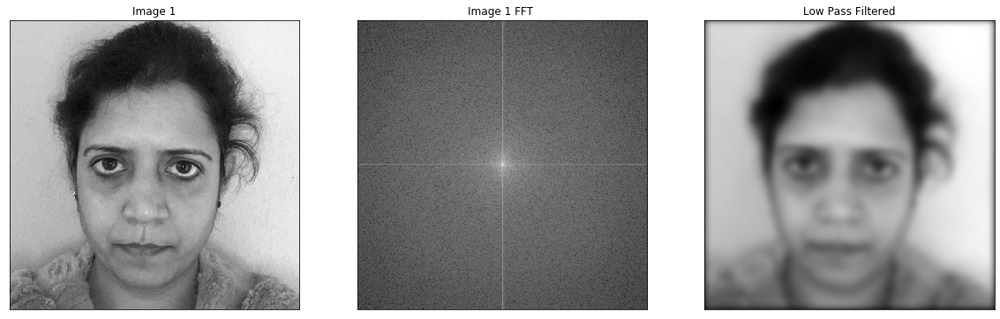

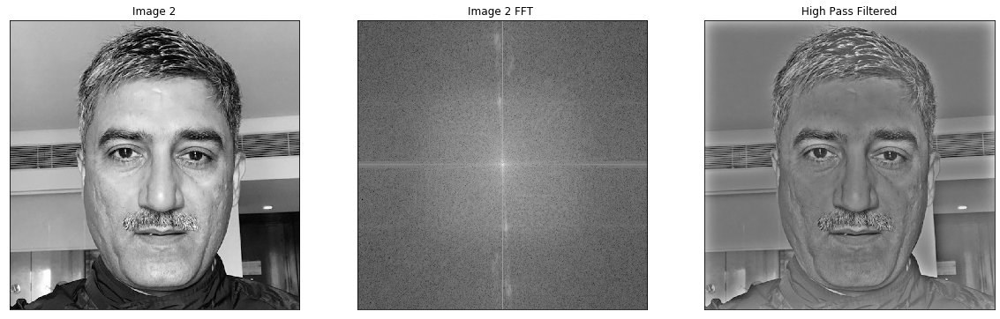

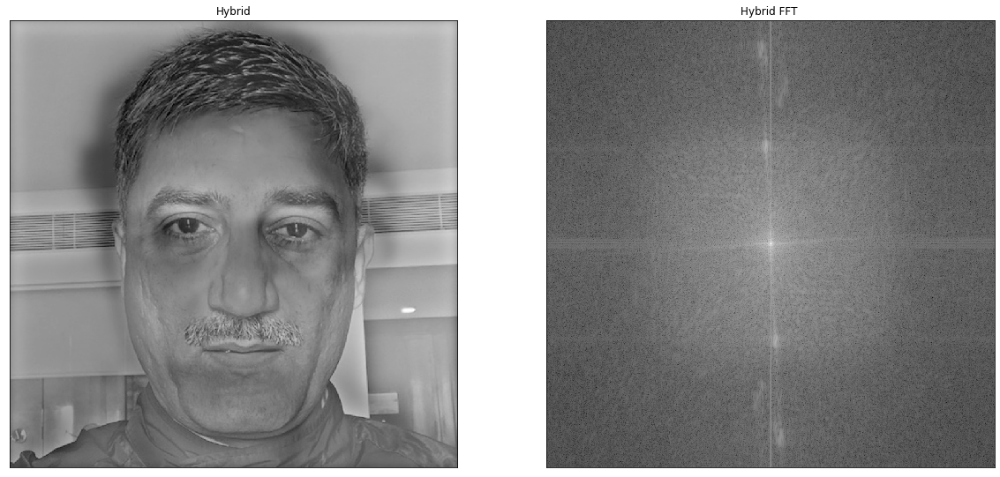

In [47]:
cutoff_low = 10
cutoff_high = 20

im_hybrid = hybridImage(im1, im2, cutoff_low, cutoff_high)


In [48]:
# Display log FFT for original and Hybrid Images

In [49]:
extn = os.path.splitext(im_one_filename)[1]

o_img_file_prefix = os.path.join(image_path,'hybrid_' + os.path.splitext(im_one_filename)[0] +'_'+ os.path.splitext(im_two_filename)[0])
o_img_file = o_img_file_prefix + extn
print('Output File: ' + o_img_file)

cv2.imwrite(o_img_file, im_hybrid)

# Resize image
im_hybrid_by_2 = im_hybrid



Output File: ./data/hybrid_female_male.jpg


(Text(0.5, 1.0, 'Hybrid'), [], [])

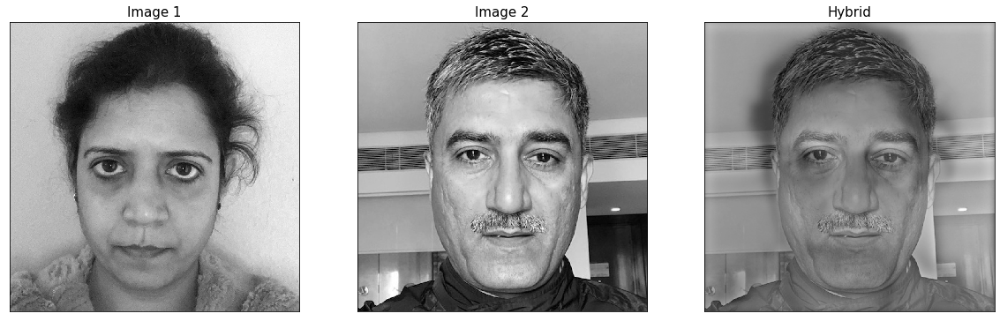

In [50]:
fig, axes = plt.subplots(1, 3, figsize=(20,20)) 

axes[0].imshow(im1,cmap='gray') 
axes[0].set_title('Image 1', fontsize=15), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im2,cmap='gray') 
axes[1].set_title('Image 2', fontsize=15 ), axes[1].set_xticks([]), axes[1].set_yticks([])

axes[2].imshow(im_hybrid,cmap='gray') 
axes[2].set_title('Hybrid', fontsize=15), axes[2].set_xticks([]), axes[2].set_yticks([])




#### Now we shall illustrate how reducing the image size & resolution changes the dominant face in the image


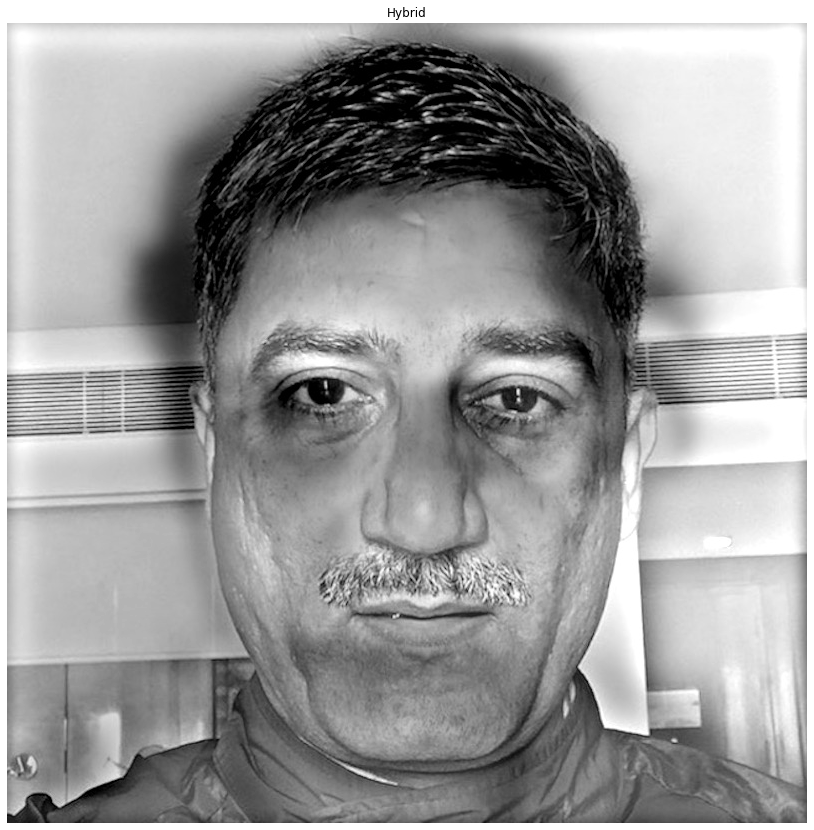

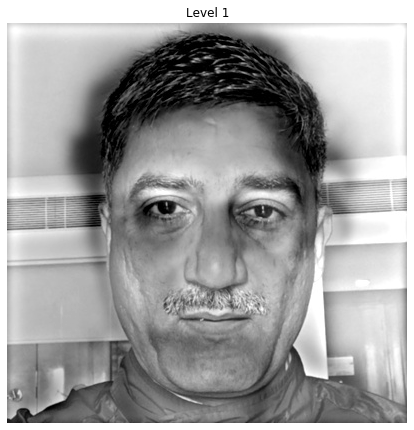

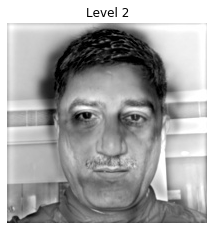

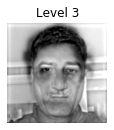

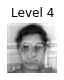

In [51]:
im_hybrid_low1 = cv2.pyrDown(im_hybrid)
o_img_file_low1 = o_img_file_prefix + '_lower_1' + extn

cv2.imwrite(o_img_file_low1, im_hybrid_low1)

im_hybrid_low2 = cv2.pyrDown(im_hybrid_low1)
o_img_file_low2 = o_img_file_prefix + '_lower_2' + extn
cv2.imwrite(o_img_file_low2, im_hybrid_low2)

im_hybrid_low3 = cv2.pyrDown(im_hybrid_low2)
o_img_file_low3 = o_img_file_prefix + '_lower_3' + extn
cv2.imwrite(o_img_file_low3, im_hybrid_low3)

im_hybrid_low4 = cv2.pyrDown(im_hybrid_low3)
o_img_file_low4 = o_img_file_prefix + '_lower_4' + extn
cv2.imwrite(o_img_file_low4, im_hybrid_low4)


display_image_correct_size(o_img_file, 'Hybrid')
display_image_correct_size(o_img_file_low1, 'Level 1')
display_image_correct_size(o_img_file_low2, 'Level 2')
display_image_correct_size(o_img_file_low3, 'Level 3')
display_image_correct_size(o_img_file_low4, 'Level 4')


In [52]:
#Resize images
im_hybrid_2 = resize2half(im_hybrid)
o_img_file_2 = o_img_file_prefix + '_by_2' + extn
cv2.imwrite(o_img_file_2, im_hybrid_2)

im_hybrid_4 = resize2half(im_hybrid_2)
o_img_file_4 = o_img_file_prefix + '_by_4' + extn
cv2.imwrite(o_img_file_4, im_hybrid_4)

im_hybrid_8 = resize2half(im_hybrid_4)
o_img_file_8 = o_img_file_prefix + '_by_8' + extn
cv2.imwrite(o_img_file_8, im_hybrid_8)

im_hybrid_16 = resize2half(im_hybrid_8)
o_img_file_16 = o_img_file_prefix + '_by_16' + extn
cv2.imwrite(o_img_file_16, im_hybrid_16)



True

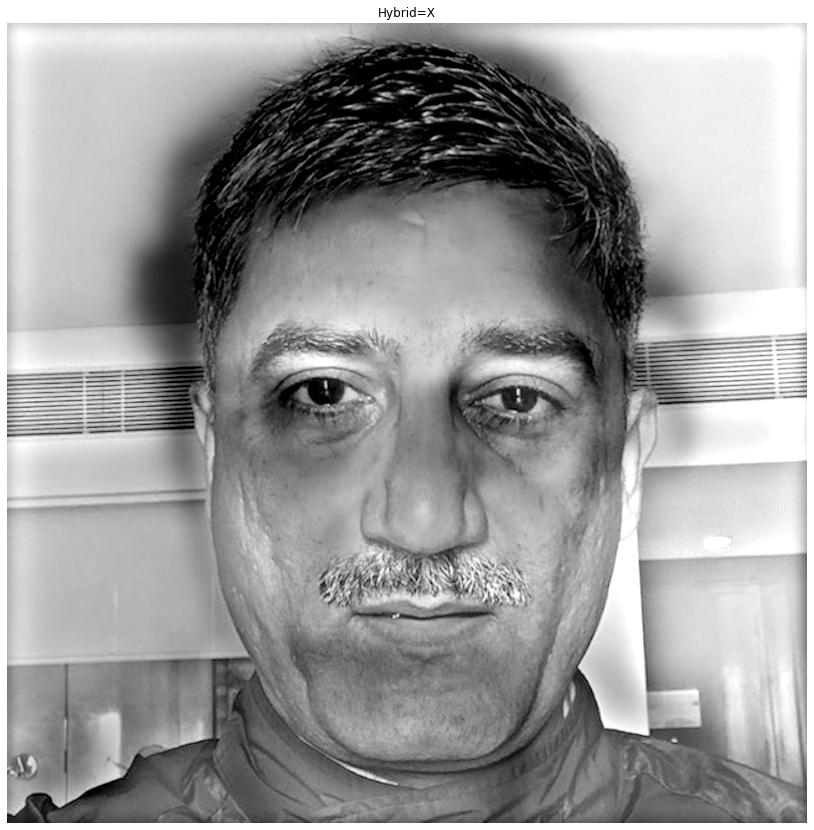

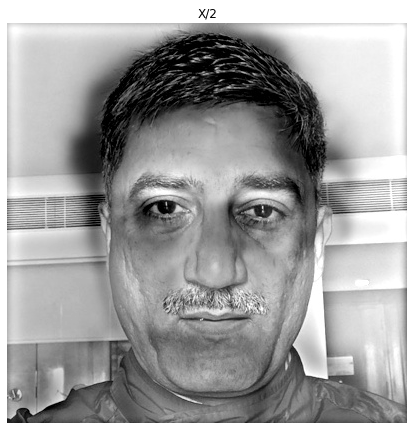

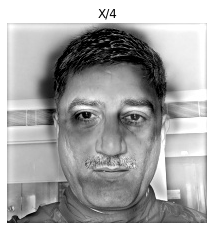

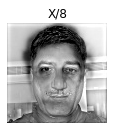

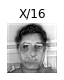

In [53]:
display_image_correct_size(o_img_file, 'Hybrid=X')
display_image_correct_size(o_img_file_2, 'X/2')
display_image_correct_size(o_img_file_4, 'X/4')
display_image_correct_size(o_img_file_8, 'X/8')
display_image_correct_size(o_img_file_16, 'X/16')

##### As we can see the Hybrid Image at original size shows the 'Cat' 
#### but when reduced by 1/16th it shows the 'Dog'

## Part II : Image Enhancements

##### Brightness and contrast adjustments

#####       g(x)=αf(x)+β 

#####   where the parameters α>0 and β are called the gain(constrast control) and bias(brightness control) 
#####   parameters; 

##### If f(x) as the source image pixels and g(x) as the output image pixels. Then, more conveniently we can write the expression as:

#####       g(i,j)=α⋅f(i,j)+β

#####   where i and j indicates that the pixel is located in the i-th row and j-th column.

In [21]:
def gainAndBiasAdjustment(im, alpha, beta):
    
    # Alpha range  1.0 - 3.0 (Constrast Control)
    # Beta range0-100 (Brightness Control) 
    
    im_enh = np.zeros(im.shape, im.dtype)
    im_enh = cv2.convertScaleAbs(im, alpha=alpha, beta=beta)
    
    return im_enh


##### Gamma correction can also be used to correct the brightness of an image 
##### by using a non linear transformation between the input values and the mapped output values:

#####    O=(I255)γ×255

In [22]:
def gammaCorrection(im, gamma):
    lookUpTable = np.empty((1,256), np.uint8)
    for i in range(256):
        lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    im_enh = cv2.LUT(im, lookUpTable)
    
    return im_enh


##### Histogram Adjustment for Color shift


In [23]:
def histogramAdjust(im):
    return im

### Contrast Enhancement

#### 'Gamma Correction' for contrast enhancement

In [24]:
im_filename = os.path.join(image_path, 'agra_fort.jpg')
im_orig = readImageColor(im_filename)
extn = os.path.splitext(im_filename)[1]

im_enh = gammaCorrection(im_orig, 1.4)

(Text(0.5, 1.0, 'Enhanced Contrast with Gamma Correction'), [], [])

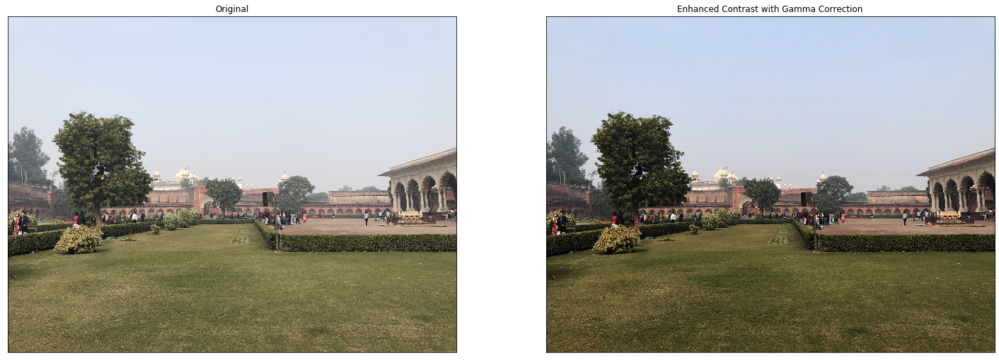

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(25, 20))

axes[0].imshow(im_orig,cmap='gray') 
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im_enh,cmap='gray') 
axes[1].set_title('Enhanced Contrast with Gamma Correction'), axes[1].set_xticks([]), axes[1].set_yticks([])


In [26]:
im_enh_final = cv2.cvtColor(im_enh, cv2.COLOR_RGB2BGR)
cv2.imwrite(os.path.join(image_path, 'contrast_enh.jpg'),im_enh_final)

True

##### 'Gamma Correction' over an image after adjusting 'Gain' and 'Bias'

In [27]:
im_filename = os.path.join(image_path, 'sunrise.png')
extn = os.path.splitext(im_filename)[1]


In [28]:
im_orig = readImageColor(im_filename)

im_enh_1 = gainAndBiasAdjustment(im_orig, 1.5, 2)
im_enh_2 = gammaCorrection(im_enh_1, 1.0)

im_enh_final = cv2.cvtColor(im_enh_2, cv2.COLOR_RGB2BGR)

(Text(0.5, 1.0, 'Enhanced with Gamma Correction'), [], [])

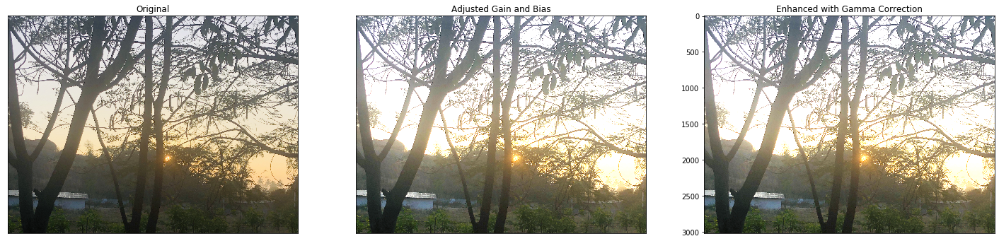

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(25, 20))

axes[0].imshow(im_orig,cmap='gray') 
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im_enh_1,cmap='gray') 
axes[1].set_title('Adjusted Gain and Bias'), axes[1].set_xticks([]), axes[1].set_yticks([])

axes[2].imshow(im_enh_2,cmap='gray') 
axes[2].set_title('Enhanced with Gamma Correction'), axes[2].set_xticks([]), axes[1].set_yticks([])

### Color Enhancement

In [30]:
im_filename = os.path.join(image_path, 'gangtok.jpg')

In [31]:
im_orig = cv2.imread(im_filename, cv2.IMREAD_COLOR) 
im_rgb = cv2.cvtColor(im_orig, cv2.COLOR_BGR2RGB)
im_hsv = cv2.cvtColor(im_orig, cv2.COLOR_BGR2HSV)

##### Using Histogram Equalization for Color Shift 

In [32]:
h,s,v = cv2.split(im_hsv)

v_enh = cv2.equalizeHist(v)

im_enh = cv2.merge((h,s,v_enh))

im_enh1 = cv2.cvtColor(im_enh, cv2.COLOR_HSV2RGB)

##### Using Adaptive Histogram Equalization for Color Shift 

In [33]:
cliplimit = 2.0
gridsize = 8

clahe = cv2.createCLAHE(clipLimit=cliplimit,tileGridSize=(gridsize,gridsize))

v_enh = clahe.apply(v)

im_enh = cv2.merge((h,s,v_enh))

im_enh2 = cv2.cvtColor(im_enh, cv2.COLOR_HSV2RGB)
im_enh2_final = cv2.cvtColor(im_enh2, cv2.COLOR_RGB2BGR)

cv2.imwrite(os.path.join(image_path, 'color_enh.jpg'), im_enh2_final)

True

(Text(0.5, 1.0, 'Adaptive Histogram Equalization'), [], [])

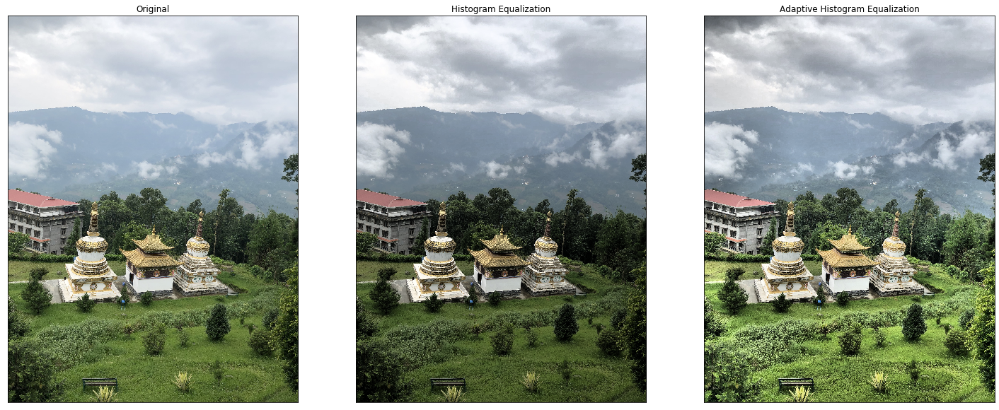

In [34]:
fig, axes = plt.subplots(1,3, figsize=(25, 20))

axes[0].imshow(im_rgb,cmap='gray') 
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im_enh1,cmap='gray') 
axes[1].set_title('Histogram Equalization'), axes[1].set_xticks([]), axes[1].set_yticks([])

axes[2].imshow(im_enh2,cmap='gray') 
axes[2].set_title('Adaptive Histogram Equalization'), axes[2].set_xticks([]), axes[2].set_yticks([])


### Color Shift Enhancement

In [35]:
im_filename = os.path.join(image_path, 'bright_colors.jpg')
im_orig = cv2.imread(im_filename)
im_rgb = cv2.cvtColor(im_orig, cv2.COLOR_BGR2RGB)
im_lab = cv2.cvtColor(im_orig, cv2.COLOR_BGR2LAB)

In [36]:
cliplimit = 2.0
gridsize = 8

l, a, b = cv2.split(im_lab)

clahe = cv2.createCLAHE(clipLimit=cliplimit,tileGridSize=(gridsize,gridsize))
a_enh = clahe.apply(a)
im_enh1 = cv2.merge((l,a_enh,b))

im_enh1 = cv2.cvtColor(im_enh1, cv2.COLOR_LAB2RGB)
im_enh1_final = cv2.cvtColor(im_enh1, cv2.COLOR_RGB2BGR)

cv2.imwrite(os.path.join(image_path, 'colorshift_morered.jpg'), im_enh_final)

True

(Text(0.5, 1.0, 'Enhanced Red'), [], [])

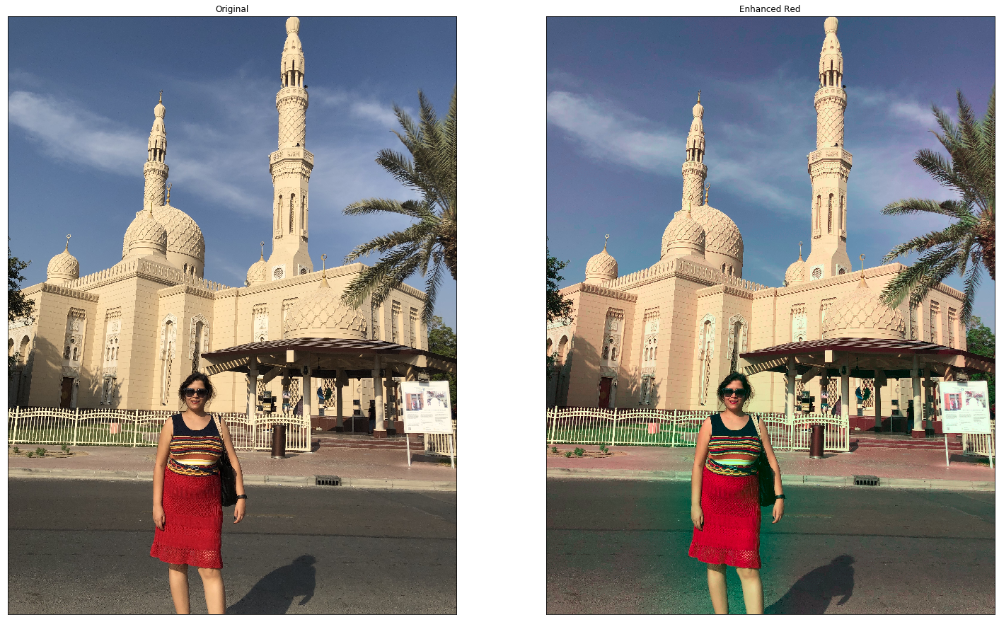

In [37]:
fig, axes = plt.subplots(1,2, figsize=(25, 20))

axes[0].imshow(im_rgb,cmap='gray') 
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im_enh1,cmap='gray') 
axes[1].set_title('Enhanced Red'), axes[1].set_xticks([]), axes[1].set_yticks([])

In [38]:
im_filename = os.path.join(image_path, 'red_yellow.jpg')
im_orig = cv2.imread(im_filename)
im_rgb = cv2.cvtColor(im_orig, cv2.COLOR_BGR2RGB)
im_lab = cv2.cvtColor(im_orig, cv2.COLOR_BGR2LAB)

In [43]:
cliplimit = 2.0
gridsize = 8

l, a, b = cv2.split(im_lab)

clahe = cv2.createCLAHE(clipLimit=cliplimit,tileGridSize=(gridsize,gridsize))

b_enh = clahe.apply(b)

im_enh2 = cv2.merge((l,a,b_enh))

im_enh2 = cv2.cvtColor(im_enh2, cv2.COLOR_LAB2RGB)
im_enh2_final = cv2.cvtColor(im_enh2, cv2.COLOR_RGB2BGR)

cv2.imwrite(os.path.join(image_path, 'colorshift_lessyellow.jpg'), im_enh_final)

True

(Text(0.5, 1.0, 'Less Yellow'), [], [])

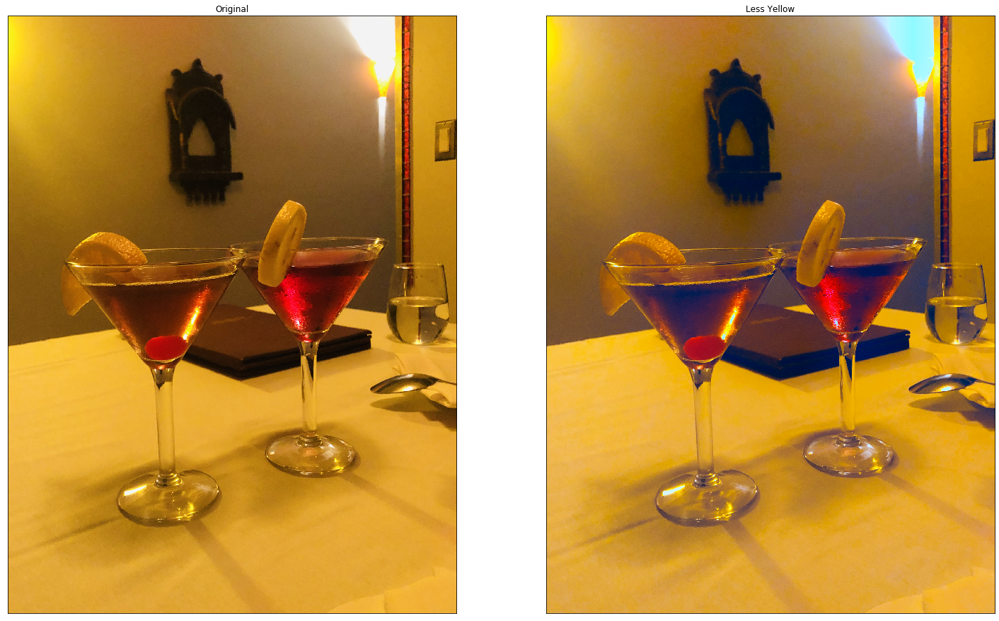

In [44]:
fig, axes = plt.subplots(1,2, figsize=(25, 20))

axes[0].imshow(im_rgb,cmap='gray') 
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])

axes[1].imshow(im_enh2,cmap='gray') 
axes[1].set_title('Less Yellow'), axes[1].set_xticks([]), axes[1].set_yticks([])


## Thank you!